In [1]:
import json
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from src.aggregator import *

pd.set_option('display.max_colwidth', -1)

C:\Users\risto\AppData\Local\Temp\ipykernel_22444\701835970.py:11: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


## Data

In [2]:
df=pd.read_csv('data/interim/stenos_cleaned_topics.csv')
df.shape

(209949, 22)

In [3]:
df=df[~pd.isnull(df.speaker)]
df.shape

(209938, 22)

In [4]:
df_topic_clusters=pd.read_excel('data/interim/riigikogu_topics_clusters.xlsx')
df_topic_clusters.shape

(1152, 8)

## Colors for plots

In [5]:
colors=json.loads(Path('utils/colors.json').read_text())
colors=list(colors.keys())[10:]

## Non-informative clusters and topics

In [6]:
#detected by plotting data and visually inspectig topic names
clusters_noninform=[0,1, 4, 5, 9, 10,14,15,16]
topics_noninform=[1, 2, 3, 22, 96, 122, 844, 589, 1059, 140, 408,
                 420, 539, 423, 314, 1079, 568, 190, 987, 21, 287]

In [7]:
#save for future use
pd.DataFrame(clusters_noninform).to_csv('data/interim/noninform_clusters.csv', index=False)
pd.DataFrame(topics_noninform).to_csv('data/interim/noninform_topics.csv', index=False)

In [8]:
df_inform=df[(~df.topic_cluster.isin(clusters_noninform))&(~df.topic_id.isin(topics_noninform))]
df_inform.shape

(96770, 22)

## Save informative data

In [9]:
df_inform.to_csv('data/interim/stenos_cleaned_topics_inform.csv', index=False)

## Informative vs noninformative segments dynamics

In [10]:
df_seg_count=pd.DataFrame(df_inform.groupby('year')['link_steno'].count())
df_seg_count.columns=['inform']
df_seg_count['noninform']=df.groupby('year')['link_steno'].count()

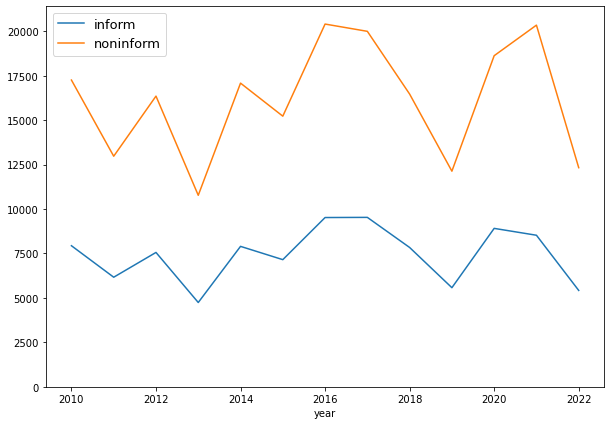

In [11]:
fig, ax =plt.subplots(figsize=(10,7))
plt.rcParams.update({'font.size': 13})
ax=df_seg_count.plot(ax=ax)
ax.set_ylim([0, df_seg_count['noninform'].max()+1000])
plt.savefig('visualisations/png/inform_noniform_segments_count_dynamics.png')

## Topic cluster dynamics

Topic cluster segment counts

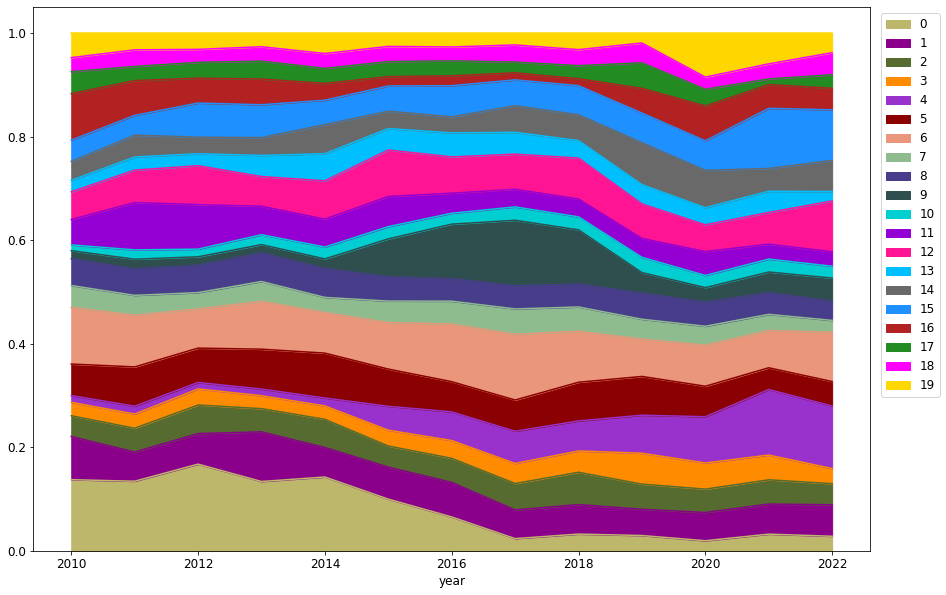

In [12]:
#topic cluster counts
plot_topic_time_dynamics(df, colors, topic_col='topic_cluster', use_percentage=True, normalize_timesteps=True)

Topic cluster porportions

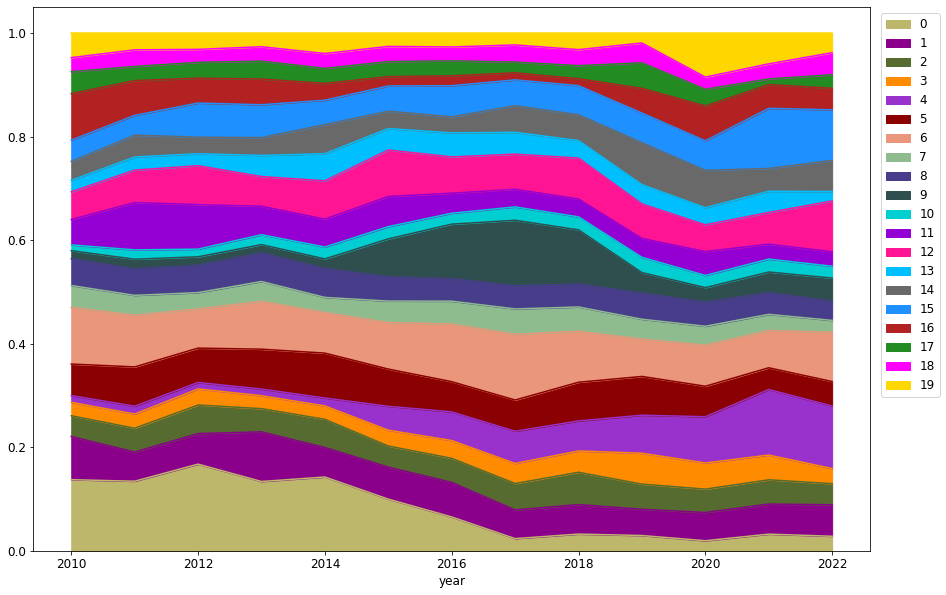

In [13]:
#topic cluster proportions
plot_topic_time_dynamics(df, colors, topic_col='topic_cluster')

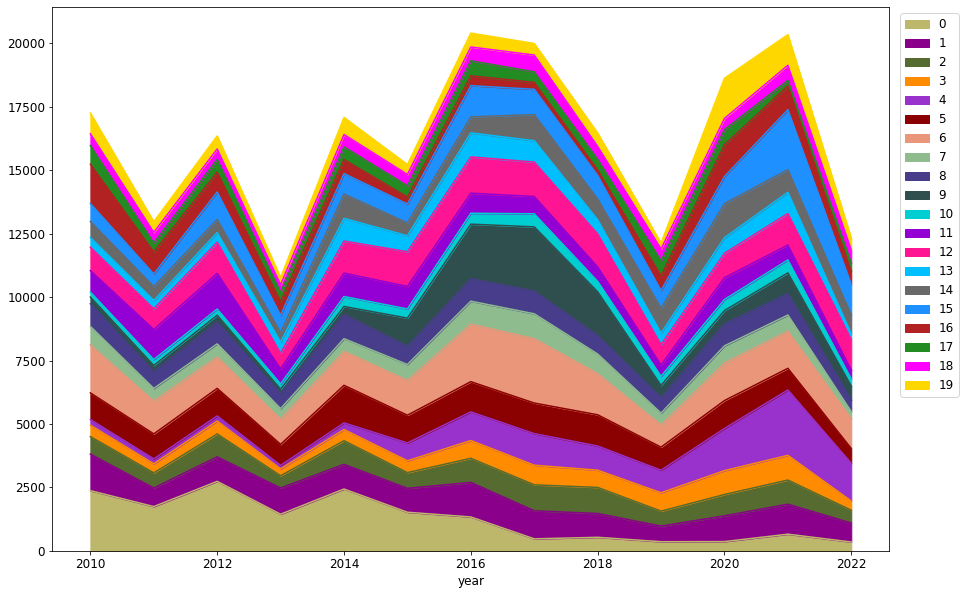

In [14]:
#topic cluster proportions
plot_topic_time_dynamics(df, colors, topic_col='topic_cluster',  use_percentage=False)

Informative topic cluster counts

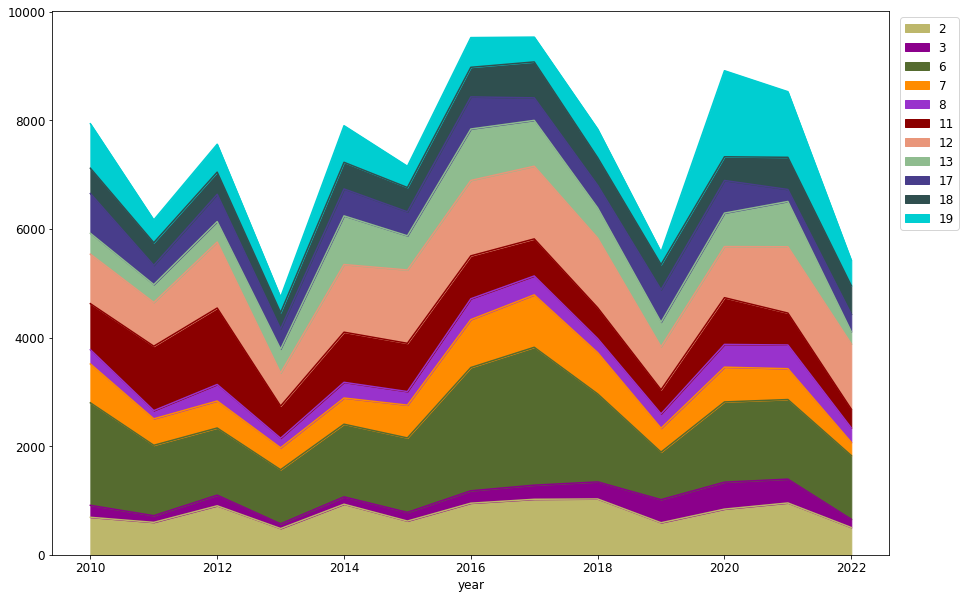

In [15]:
#keeping only informative clusters, topics
plot_topic_time_dynamics(df_inform, colors, topic_col='topic_cluster', use_percentage=False)

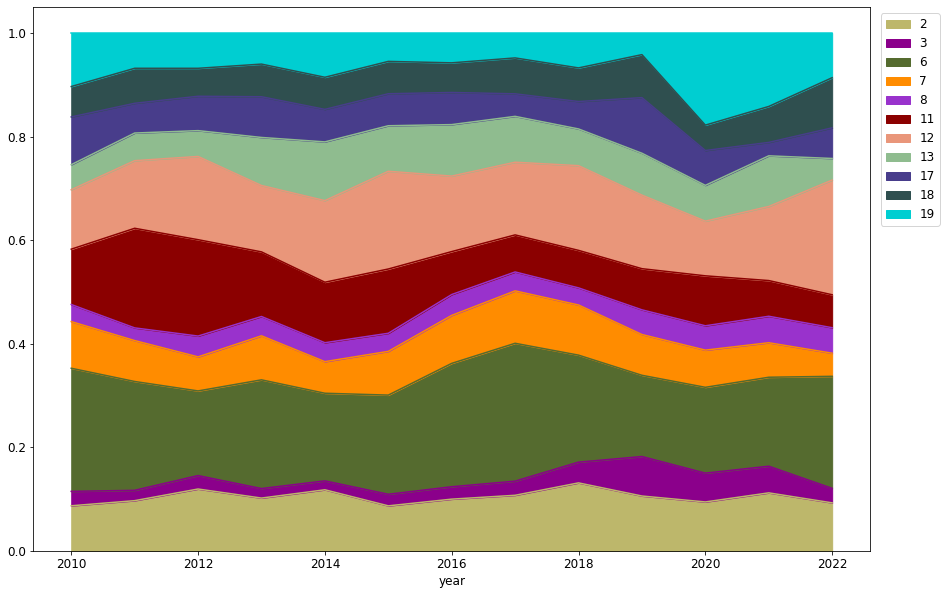

In [16]:
#Informative topic cluster proportions
plot_topic_time_dynamics(df_inform, colors, topic_col='topic_cluster', use_percentage=True)

## Some cluster topics dynamics

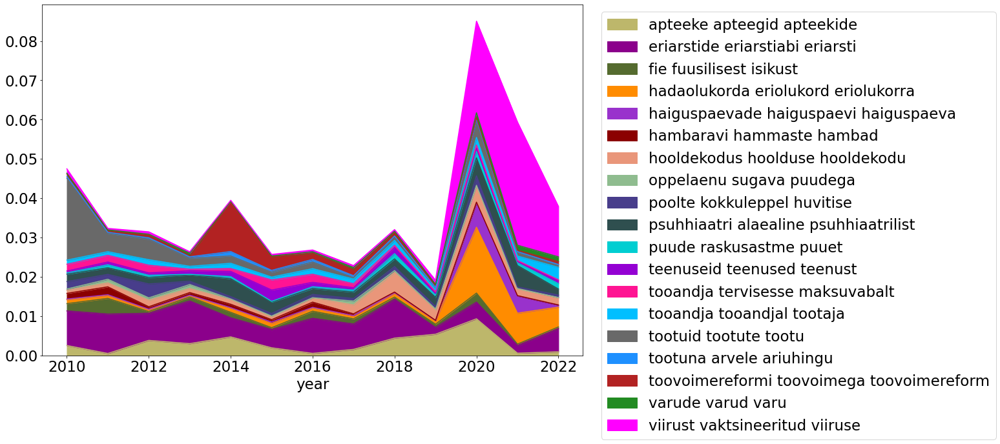

In [17]:
cluster_id=19
FONT_SIZE=23
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

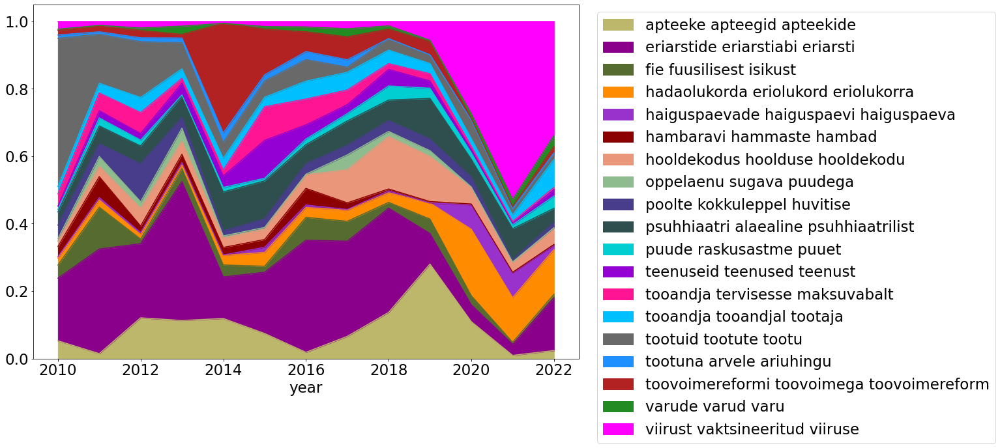

In [18]:
cluster_id=19
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True,legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

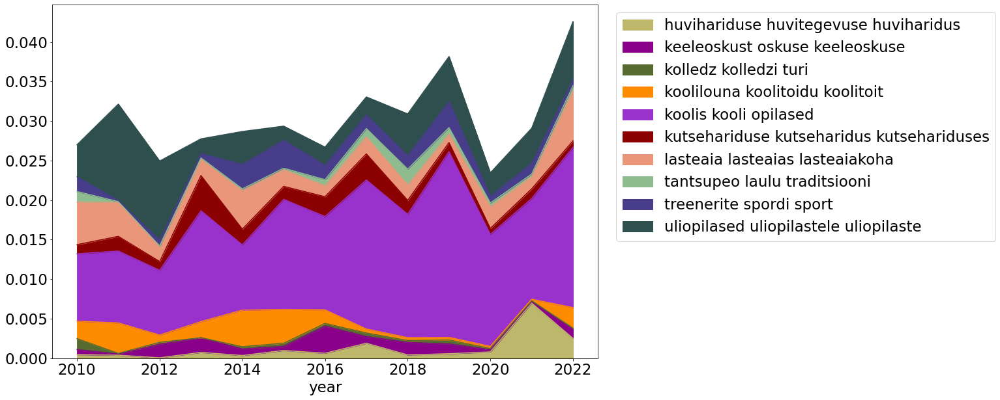

In [19]:
cluster_id=18
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

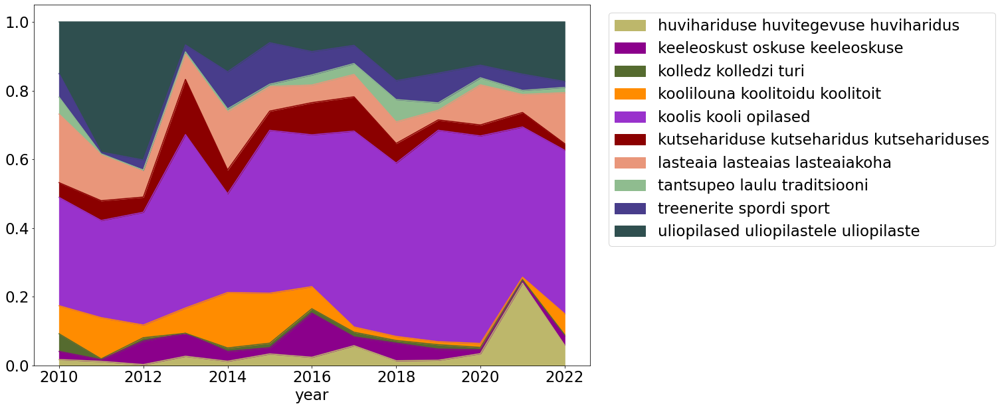

In [20]:
cluster_id=18
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

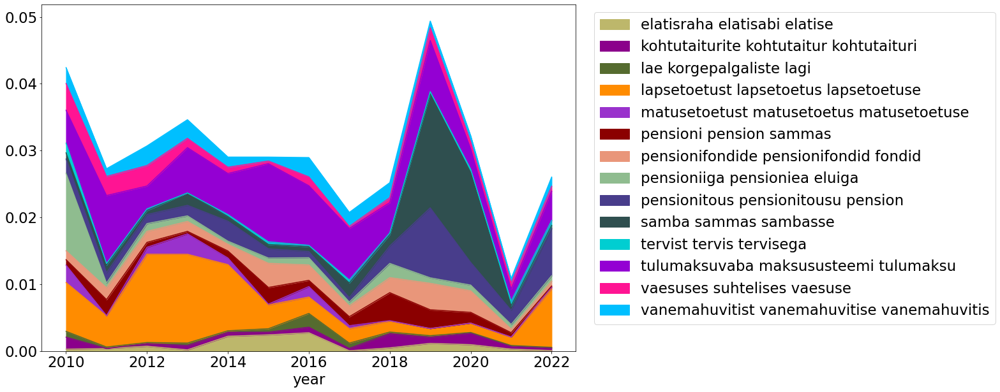

In [21]:
cluster_id=17
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

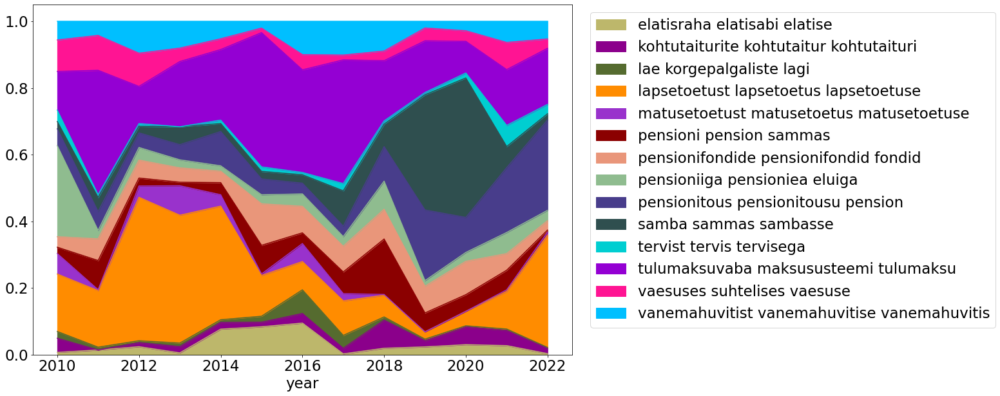

In [22]:
cluster_id=17
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

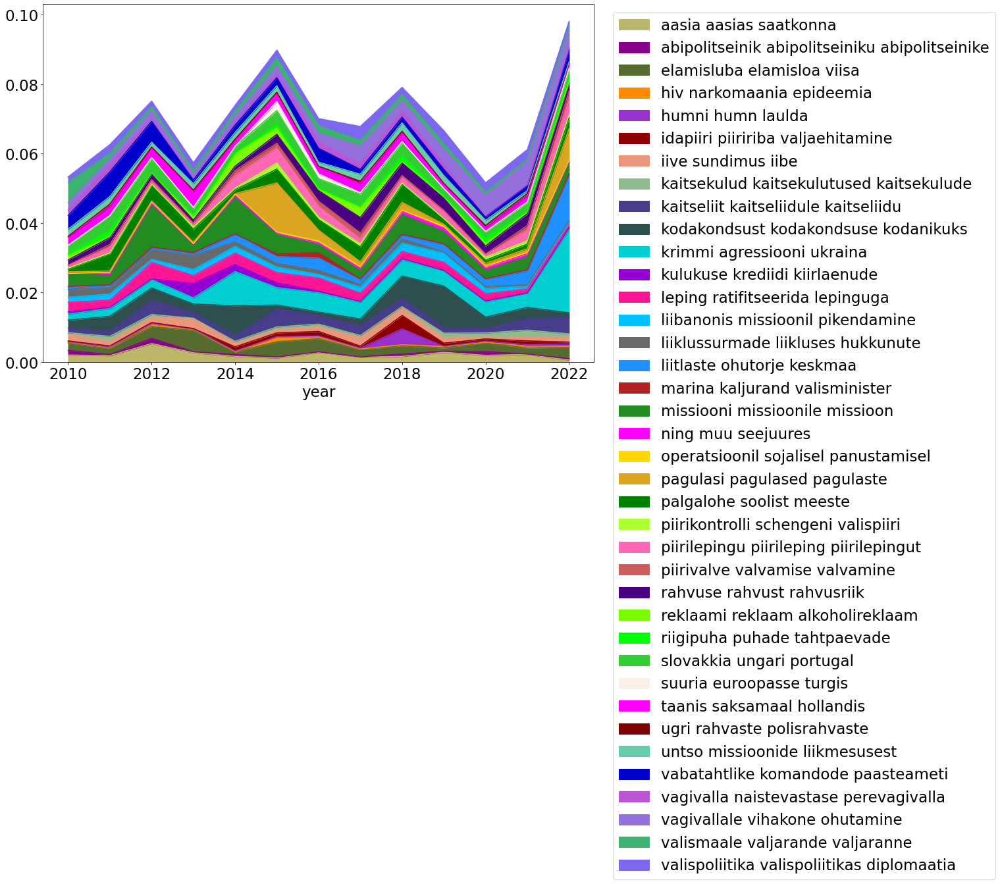

In [23]:
cluster_id=12
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

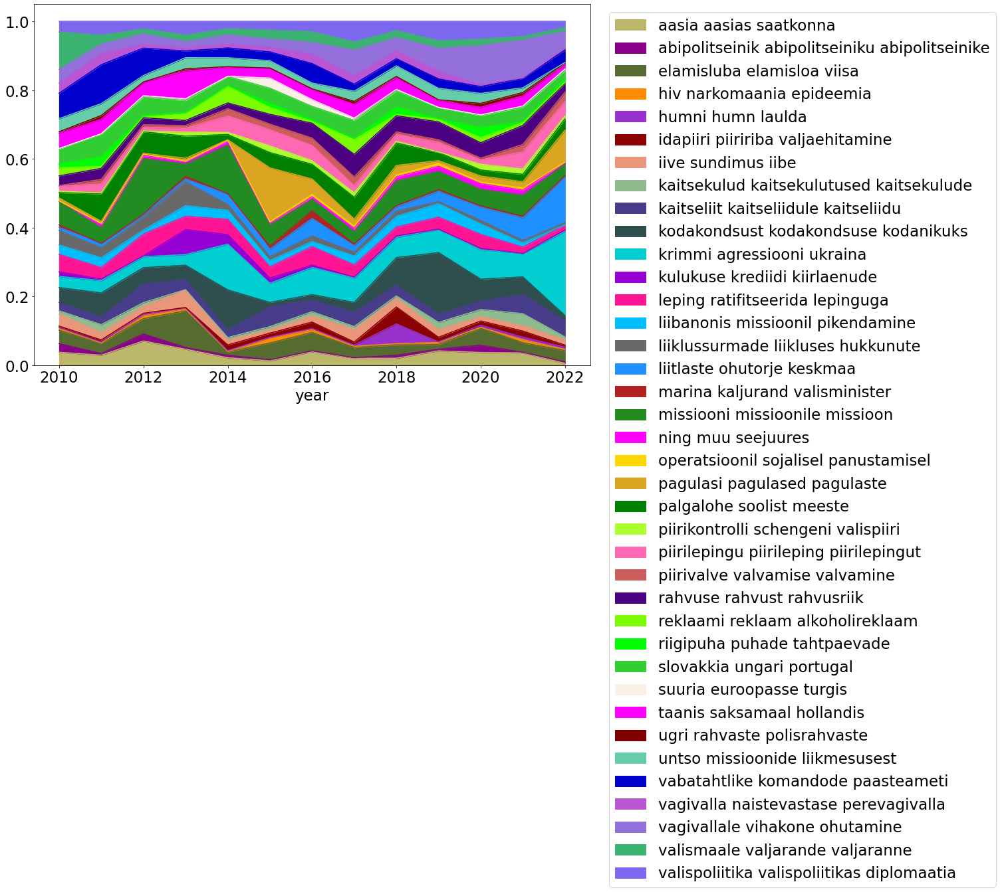

In [24]:
cluster_id=12
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

In [25]:
df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:10].index.tolist()

['krimmi agressiooni ukraina',
 'missiooni missioonile missioon',
 'kodakondsust kodakondsuse kodanikuks',
 'vagivallale vihakone ohutamine',
 'palgalohe soolist meeste',
 'slovakkia ungari portugal',
 'vabatahtlike komandode paasteameti',
 'elamisluba elamisloa viisa',
 'kaitseliit kaitseliidule kaitseliidu',
 'leping ratifitseerida lepinguga']

In [26]:
df[df.topic_cluster==12].topic_words.nunique()

38

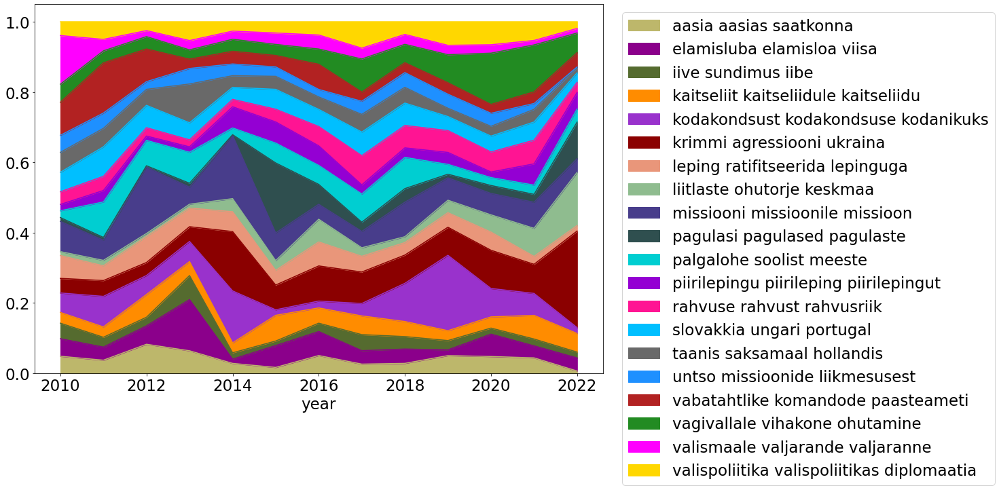

In [27]:
cluster_id=12
n_sub_topics=20
clust12_topics_sub=df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:n_sub_topics].index.tolist()
df_sub_12=df[(df.topic_cluster==cluster_id)&(df.topic_words3.isin(clust12_topics_sub))]
plot_topic_time_dynamics(df_sub_12, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

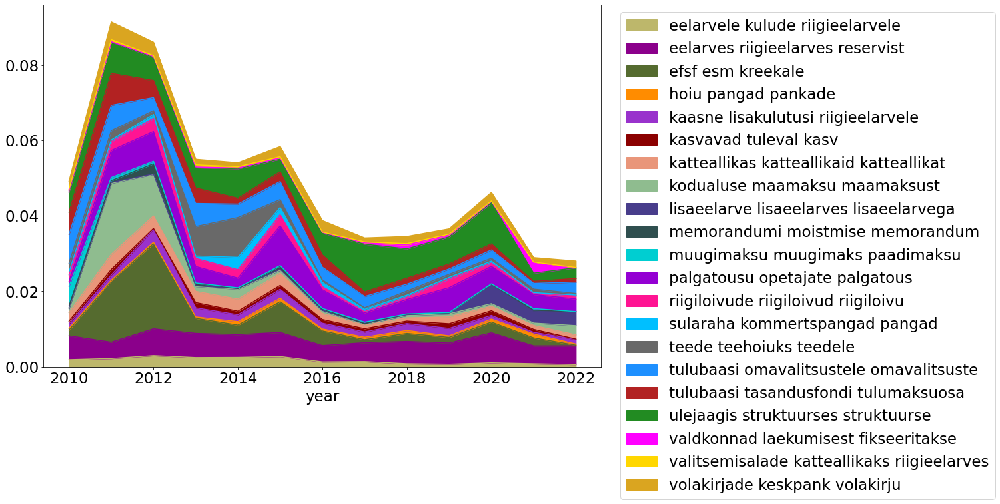

In [28]:
cluster_id=11
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

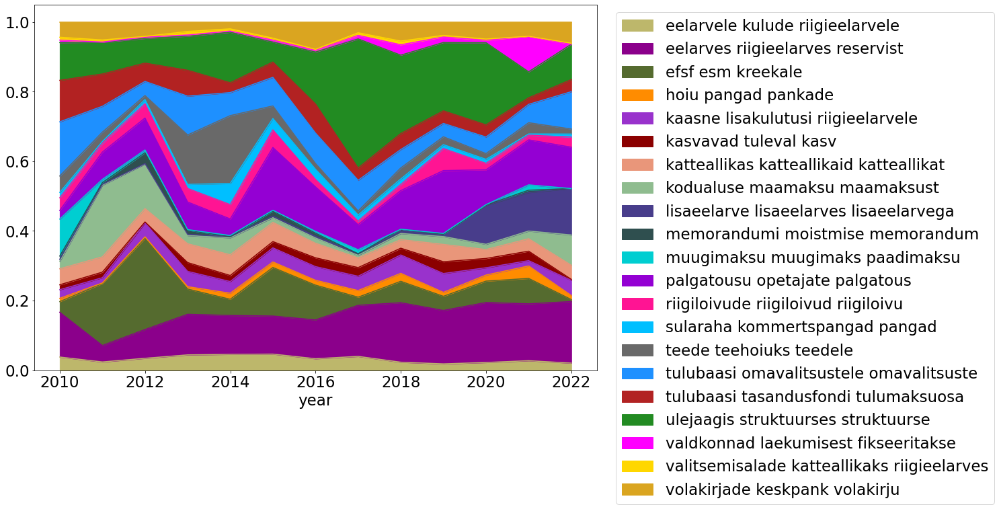

In [29]:
cluster_id=11
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

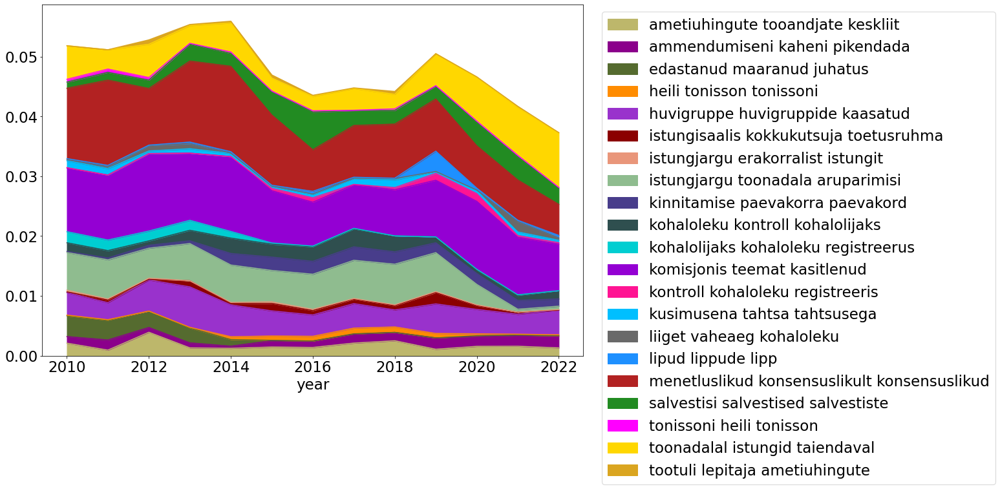

In [30]:
cluster_id=8
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

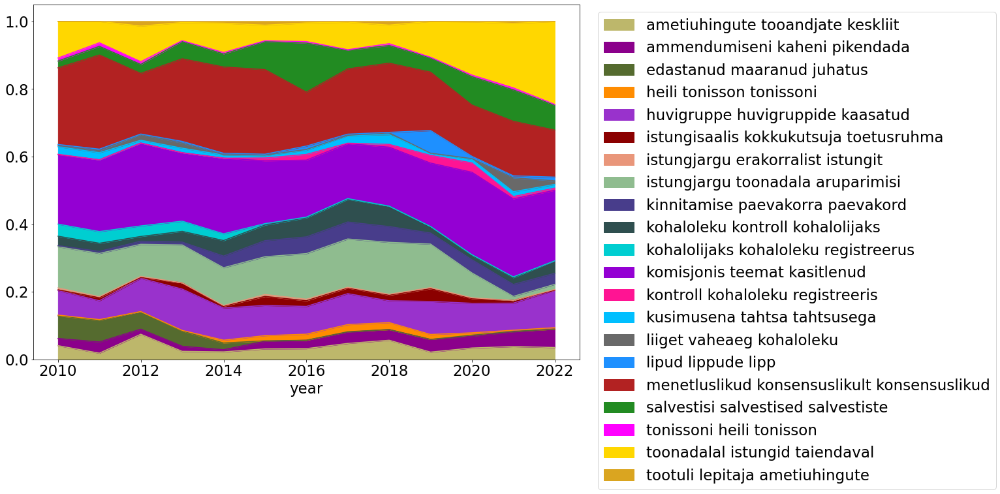

In [31]:
cluster_id=8
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

In [32]:
df[df.topic_cluster==6].topic_words.nunique()

60

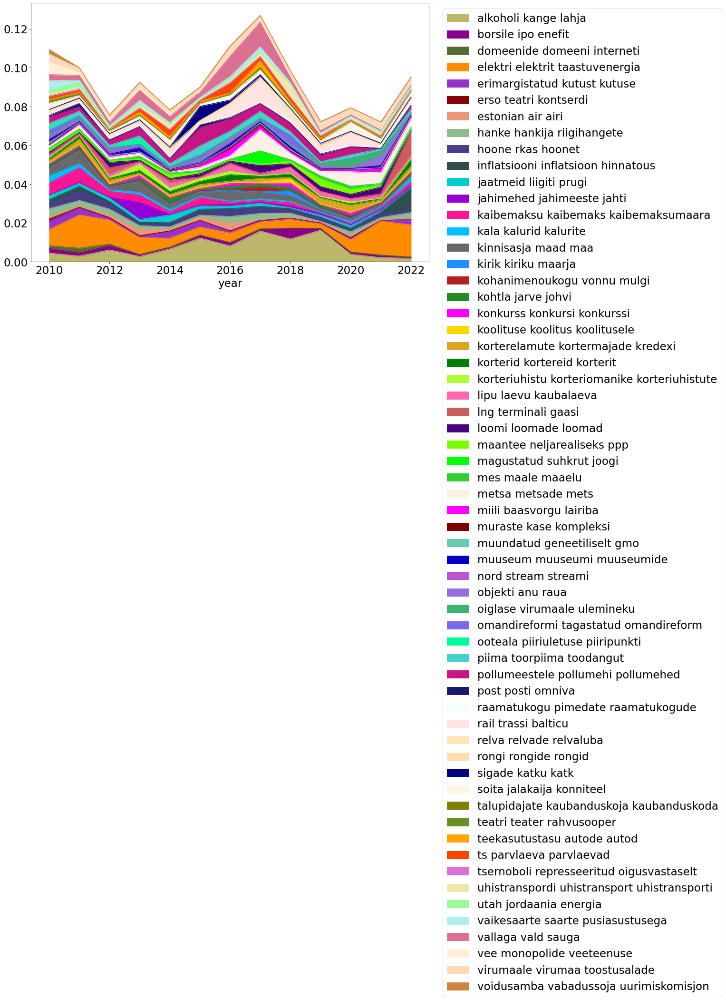

In [33]:
cluster_id=6
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

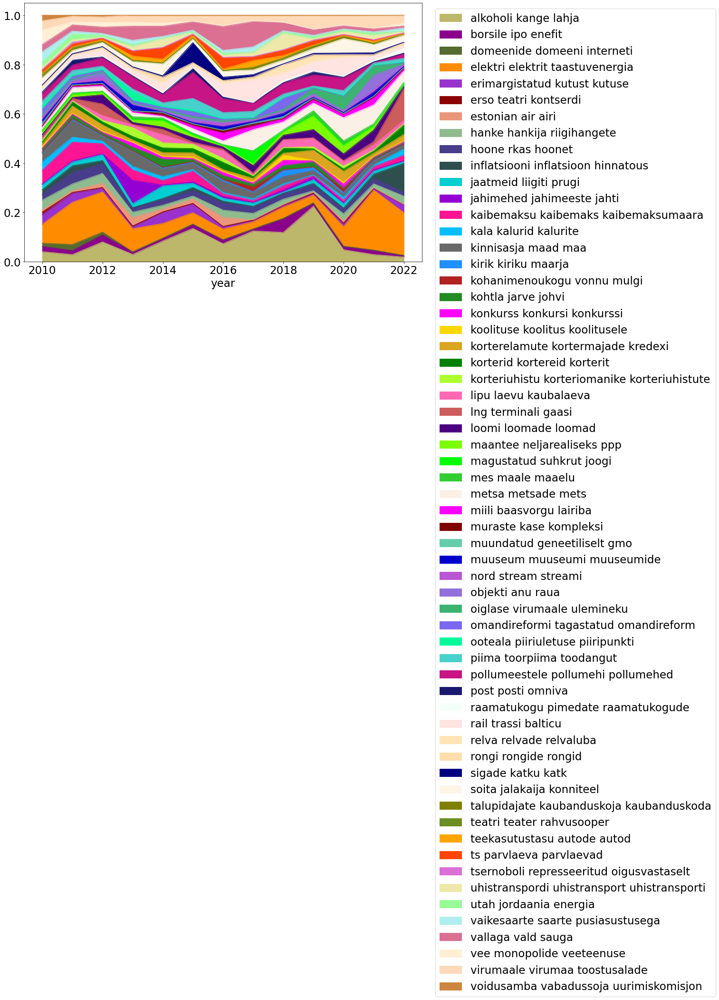

In [34]:
cluster_id=6
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

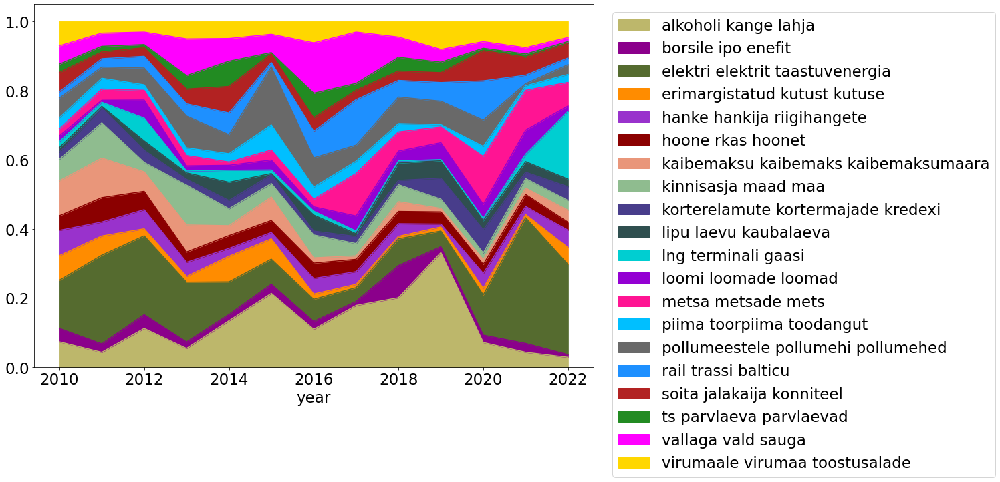

In [35]:
cluster_id=6
n_sub_topics=20
clust6_topics_sub=df[(df.topic_cluster==cluster_id)].topic_words3.value_counts()[:n_sub_topics].index.tolist()
df_sub_6=df[(df.topic_cluster==cluster_id)&(df.topic_words3.isin(clust6_topics_sub))]
plot_topic_time_dynamics(df_sub_6, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

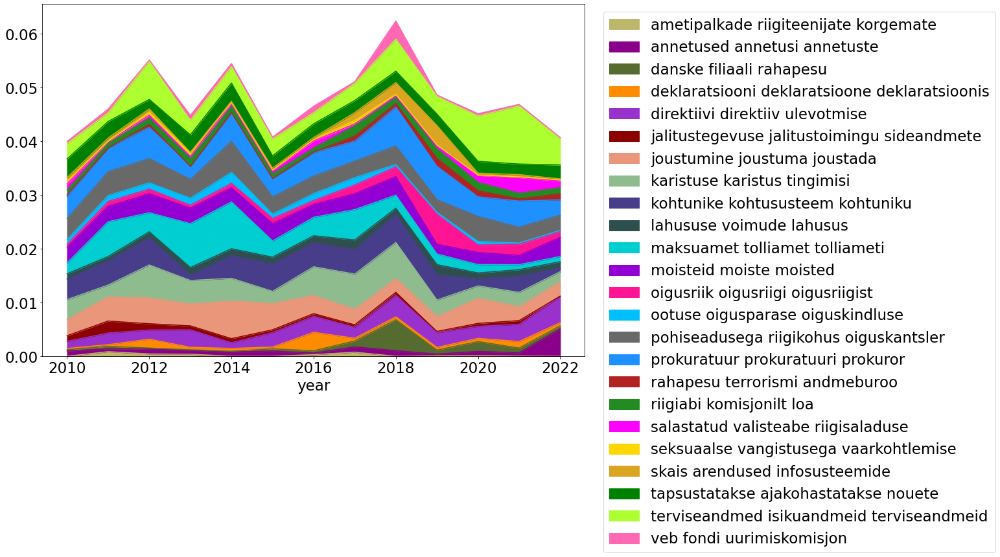

In [36]:
cluster_id=2
plot_topic_time_dynamics(df, colors, cluster_id, legend_fontsize=FONT_SIZE,
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

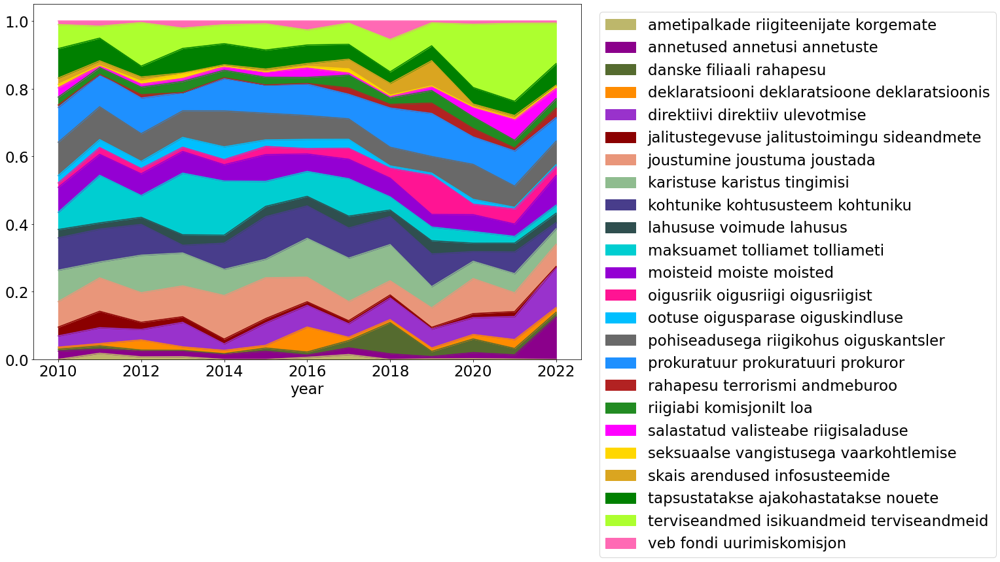

In [37]:
cluster_id=2
plot_topic_time_dynamics(df, colors, cluster_id, normalize_timesteps=True, legend_fontsize=FONT_SIZE, 
                         bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=FONT_SIZE, y_tick_fontsize=FONT_SIZE, 
                         x_axis_fontsize=FONT_SIZE)

## Most popular topics

<AxesSubplot:>

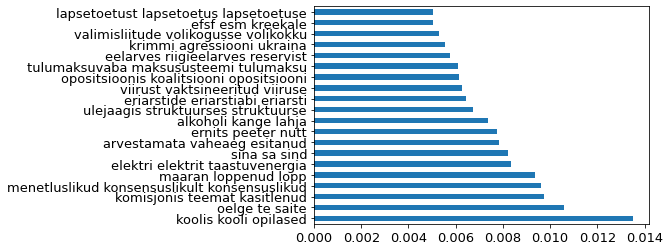

In [38]:
df.topic_words3.value_counts(normalize=True).head(20).plot(kind='barh')

<AxesSubplot:>

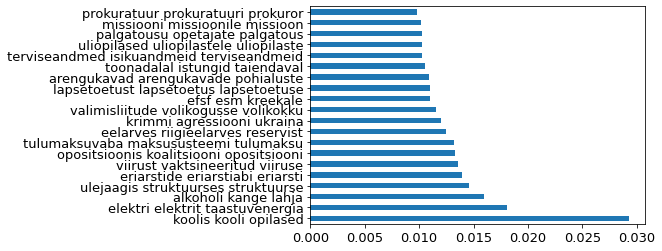

In [39]:
df_inform.topic_words3.value_counts(normalize=True).head(20).plot(kind='barh')

## Get pre-calculated trendy categories in each year

In [40]:
df_yearly_diffs_topic=pd.read_csv('data/interim/trending/yearly_comparisons/yearly_diffs_topic.csv')
df_yearly_diffs_topic_inform=pd.read_csv('data/interim/trending/yearly_comparisons/yearly_diffs_topic_inform.csv')
df_yearly_diffs_topic_inform_long=pd.read_csv('data/interim/trending/yearly_comparisons/yearly_diffs_topic_inform_long.csv')

trendy_categories=Path('data/interim/trending/yearly_comparisons/trendy_categories.txt').\
    read_text().split('\n')
trendy_categories_inform=Path('data/interim/trending/yearly_comparisons/trendy_categories_inform.txt').\
    read_text().split('\n')

In [41]:
df_yearly_diffs_topic.head()

,2010 vs 2011,2011 vs 2012,2012 vs 2013,2013 vs 2014,2014 vs 2015,2015 vs 2016,2016 vs 2017,2017 vs 2018,2018 vs 2019,2019 vs 2020,2020 vs 2021,2021 vs 2022
0,kodualuse maamaksu maamaksust 0.104% -> 1.881% (1703.37%),arvestamata vaheaeg esitanud 0.262% -> 1.663% (534.602%),haaletada haaletas haaletusele 0.459% -> 1.689% (268.308%),missiooni missioonile missioon 0.204% -> 1.048% (413.177%),palgatousu opetajate palgatous 0.258% -> 1.051% (308.027%),vallaga vald sauga 0.302% -> 1.078% (256.826%),kruuse urmas lahkunud 0.083% -> 1.405% (1586.756%),danske filiaali rahapesu 0.11% -> 0.577% (424.347%),jarviku jarvik maaeluministri 0.291% -> 2.044% (601.385%),viirust vaktsineeritud viiruse 0.107% -> 2.33% (2074.298%),elektri elektrit taastuvenergia 0.623% -> 1.75% (180.969%),krimmi agressiooni ukraina 0.418% -> 2.401% (474.717%)
1,efsf esm kreekale 0.151% -> 1.627% (979.634%),missiooni missioonile missioon 0.285% -> 1.217% (326.641%),arvestamata vaheaeg esitanud 1.663% -> 3.304% (98.647%),abielu kooselu samasooliste 0.046% -> 1.124% (2321.965%),pollumeestele pollumehi pollumehed 0.269% -> 0.952% (253.697%),arvestamata vaheaeg esitanud 0.466% -> 1.274% (173.216%),metsa metsade mets 0.162% -> 1.09% (574.12%),borsile ipo enefit 0.1% -> 0.54% (440.353%),samba sammas sambasse 0.17% -> 1.706% (903.594%),hadaolukorda eriolukord eriolukorra 0.091% -> 1.675% (1747.288%),moonika helle helme 0.123% -> 0.845% (584.646%),lng terminali gaasi 0.103% -> 1.233% (1094.554%)
2,uliopilased uliopilastele uliopilaste 0.406% -> 1.218% (200.28%),vaheaega kumneminutilist haaletust 0.108% -> 0.819% (659.256%),teede teehoiuks teedele 0.098% -> 0.78% (696.819%),krimmi agressiooni ukraina 0.176% -> 0.983% (457.689%),sigade katku katk 0.041% -> 0.729% (1679.288%),rail trassi balticu 0.072% -> 0.568% (686.786%),jurgen ligi ligil 0.074% -> 0.57% (675.547%),omandireformi tagastatud omandireform 0.055% -> 0.455% (727.916%),pensionitous pensionitousu pension 0.261% -> 1.047% (300.942%),vorklaev puustusmaa torm 0.19% -> 0.778% (310.594%),kauguhendus avaksite ettekandjalt 0.086% -> 0.782% (809.794%),inflatsiooni inflatsioon hinnatous 0.113% -> 1.119% (890.223%)
3,palgatousu opetajate palgatous 0.122% -> 0.717% (489.157%),lapsetoetust lapsetoetus lapsetoetuse 0.463% -> 1.321% (185.571%),jahimehed jahimeeste jahti 0.031% -> 0.882% (2783.726%),helir valdor seeder 0.056% -> 0.937% (1581.92%),efsf esm kreekale 0.252% -> 0.814% (223.575%),lugupeetav lugupeetavad eesistuja 0.158% -> 0.598% (279.263%),ulejaagis struktuurses struktuurse 0.578% -> 1.265% (118.793%),uhistranspordi uhistransport uhistransporti 0.195% -> 0.644% (230.034%),sikkut riina sikkuti 0.061% -> 0.552% (809.537%),metsa metsade mets 0.223% -> 0.741% (232.88%),huvihariduse huvitegevuse huviharidus 0.081% -> 0.698% (766.688%),kaja kallas kallase 0.575% -> 1.728% (200.452%)
4,elektri elektrit taastuvenergia 0.84% -> 1.711% (103.682%),terviseandmed isikuandmeid terviseandmeid 0.162% -> 0.709% (338.178%),valimisliitude volikogusse volikokku 0.135% -> 0.733% (445.01%),toovoimereformi toovoimega toovoimereform 0.028% -> 1.282% (4504.257%),pagulasi pagulased pagulaste 0.012% -> 1.412% (11962.288%),haale valimispaeval valimiste 0.099% -> 0.49% (397.394%),alkoholi kange lahja 0.809% -> 1.58% (95.433%),kodakondsust kodakondsuse kodanikuks 0.19% -> 0.632% (232.328%),jevgeni ossinovski toominister 0.079% -> 0.486% (516.105%),rahvahaaletuse rahvahaaletus rahvahaaletusel 0.115% -> 0.564% (388.466%),protseduurilise protseduuriline protseduurilist 0.354% -> 1.047% (195.462%),liitlaste ohutorje keskmaa 0.403% -> 1.322% (228.062%)


In [42]:
df_yearly_diffs_topic_inform.head()

,2010 vs 2011,2011 vs 2012,2012 vs 2013,2013 vs 2014,2014 vs 2015,2015 vs 2016,2016 vs 2017,2017 vs 2018,2018 vs 2019,2019 vs 2020,2020 vs 2021,2021 vs 2022
0,kodualuse maamaksu maamaksust 0.227% -> 3.958% (1645.02%),missiooni missioonile missioon 0.6% -> 2.633% (338.641%),teede teehoiuks teedele 0.212% -> 1.771% (736.748%),abielu kooselu samasooliste 0.105% -> 2.431% (2205.311%),palgatousu opetajate palgatous 0.557% -> 2.237% (301.615%),vallaga vald sauga 0.643% -> 2.311% (259.264%),metsa metsade mets 0.347% -> 2.288% (559.982%),danske filiaali rahapesu 0.231% -> 1.212% (425.101%),jarviku jarvik maaeluministri 0.612% -> 4.448% (626.286%),viirust vaktsineeritud viiruse 0.233% -> 4.87% (1988.684%),elektri elektrit taastuvenergia 1.302% -> 4.176% (220.791%),krimmi agressiooni ukraina 0.997% -> 5.46% (447.62%)
1,efsf esm kreekale 0.328% -> 3.423% (944.701%),lapsetoetust lapsetoetus lapsetoetuse 0.973% -> 2.858% (193.603%),valimisliitude volikogusse volikokku 0.291% -> 1.666% (472.321%),missiooni missioonile missioon 0.464% -> 2.266% (388.46%),pollumeestele pollumehi pollumehed 0.582% -> 2.027% (248.139%),rail trassi balticu 0.154% -> 1.218% (692.161%),ulejaagis struktuurses struktuurse 1.239% -> 2.655% (114.204%),borsile ipo enefit 0.21% -> 1.136% (441.131%),samba sammas sambasse 0.357% -> 3.713% (939.225%),hadaolukorda eriolukord eriolukorra 0.197% -> 3.501% (1674.55%),kauguhendus avaksite ettekandjalt 0.18% -> 1.865% (938.742%),lng terminali gaasi 0.246% -> 2.804% (1038.233%)
2,uliopilased uliopilastele uliopilaste 0.882% -> 2.563% (190.564%),terviseandmed isikuandmeid terviseandmeid 0.341% -> 1.535% (350.502%),jahimehed jahimeeste jahti 0.066% -> 2.003% (2928.232%),krimmi agressiooni ukraina 0.401% -> 2.127% (430.828%),sigade katku katk 0.089% -> 1.552% (1651.328%),haale valimispaeval valimiste 0.21% -> 1.05% (400.792%),alkoholi kange lahja 1.733% -> 3.316% (91.334%),omandireformi tagastatud omandireform 0.115% -> 0.957% (729.108%),pensionitous pensionitousu pension 0.549% -> 2.278% (315.176%),metsa metsade mets 0.484% -> 1.549% (219.773%),huvihariduse huvitegevuse huviharidus 0.168% -> 1.666% (889.527%),inflatsiooni inflatsioon hinnatous 0.27% -> 2.546% (843.535%)
3,palgatousu opetajate palgatous 0.265% -> 1.509% (470.094%),apteeke apteegid apteekide 0.097% -> 0.82% (742.75%),kinnisasja maad maa 0.318% -> 1.307% (311.733%),toovoimereformi toovoimega toovoimereform 0.063% -> 2.772% (4282.492%),pagulasi pagulased pagulaste 0.025% -> 3.006% (11772.742%),ts parvlaeva parvlaevad 0.042% -> 1.124% (2579.235%),rail trassi balticu 1.218% -> 2.434% (99.811%),uhistranspordi uhistransport uhistransporti 0.409% -> 1.353% (230.509%),koolis kooli opilased 3.279% -> 5.112% (55.887%),rahvahaaletuse rahvahaaletus rahvahaaletusel 0.251% -> 1.178% (369.232%),viirust vaktsineeritud viiruse 4.87% -> 7.484% (53.66%),pagulasi pagulased pagulaste 0.27% -> 2.066% (665.768%)
4,elektri elektrit taastuvenergia 1.827% -> 3.602% (97.092%),karistuse karistus tingimisi 0.454% -> 1.323% (191.273%),noukogudesse ariuhingute noukogudes 0.357% -> 1.244% (248.276%),valimisea valimisiga valimisoiguse 0.127% -> 1.418% (1020.637%),efsf esm kreekale 0.544% -> 1.734% (218.49%),abielu kooselu samasooliste 0.531% -> 1.397% (162.916%),magustatud suhkrut joogi 0.021% -> 1.354% (6343.909%),kodakondsust kodakondsuse kodanikuks 0.399% -> 1.327% (232.807%),kodakondsust kodakondsuse kodanikuks 1.327% -> 2.601% (95.989%),annetus erjk annetuse 0.287% -> 1.223% (326.219%),opositsiooni koalitsioonil opositsioonil 0.281% -> 1.384% (393.37%),liitlaste ohutorje keskmaa 0.962% -> 3.007% (212.594%)


In [44]:
df_yearly_diffs_topic_inform_long['change factor']=df_yearly_diffs_topic_inform_long['to_prec']/df_yearly_diffs_topic_inform_long['from_perc']
df_yearly_diffs_topic_inform_long.groupby('year').head()

,topic,from_perc,to_prec,change_perc,year,change factor
0,kodualuse maamaksu maamaksust,0.227,3.958,1645.020,2010 vs 2011,17.436123
1,efsf esm kreekale,0.328,3.423,944.701,2010 vs 2011,10.435976
2,uliopilased uliopilastele uliopilaste,0.882,2.563,190.564,2010 vs 2011,2.905896
3,palgatousu opetajate palgatous,0.265,1.509,470.094,2010 vs 2011,5.694340
4,elektri elektrit taastuvenergia,1.827,3.602,97.092,2010 vs 2011,1.971538
256,missiooni missioonile missioon,0.600,2.633,338.641,2011 vs 2012,4.388333
257,lapsetoetust lapsetoetus lapsetoetuse,0.973,2.858,193.603,2011 vs 2012,2.937307
258,terviseandmed isikuandmeid terviseandmeid,0.341,1.535,350.502,2011 vs 2012,4.501466
259,apteeke apteegid apteekide,0.097,0.820,742.750,2011 vs 2012,8.453608
260,karistuse karistus tingimisi,0.454,1.323,191.273,2011 vs 2012,2.914097


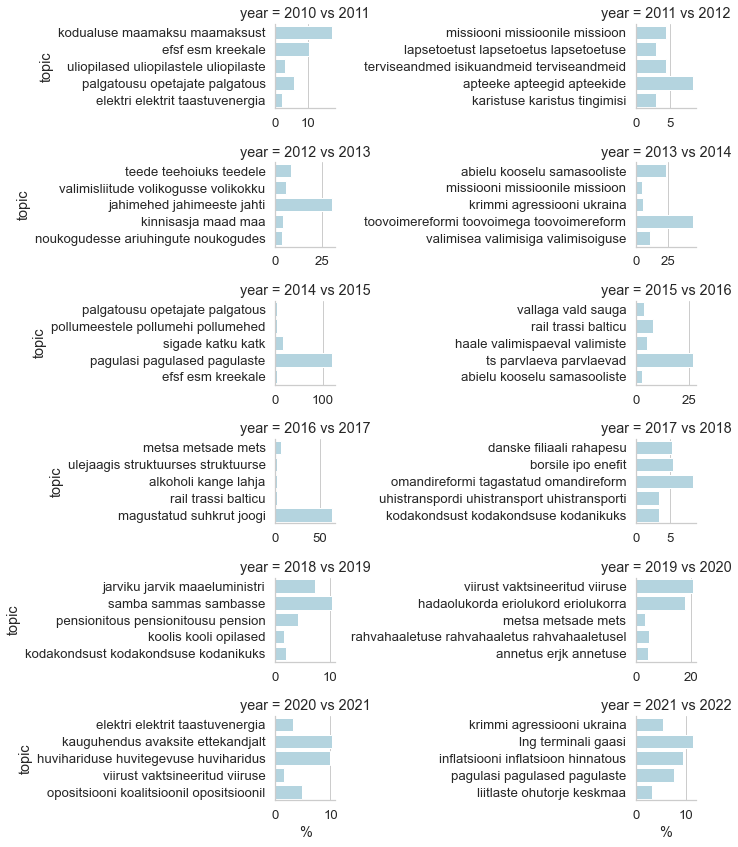

In [45]:
plot_catplot(df_yearly_diffs_topic_inform_long.groupby('year').head(), 
             'change factor', 'topic', 'year', '%', 
             'visualisations/png/yearly_increases.png',
             font_scale=1.2, sns_style='whitegrid', sharex=False,
             sharey=False, color='lightblue', col_wrap=2,
             height=2., aspect=2.5)

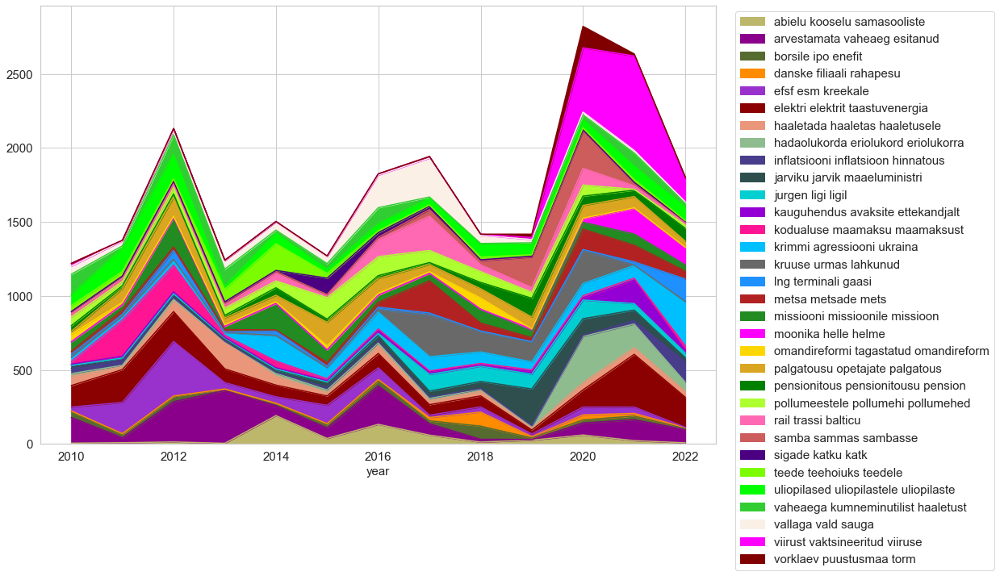

In [52]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories)], colors, use_percentage=False,
                         legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

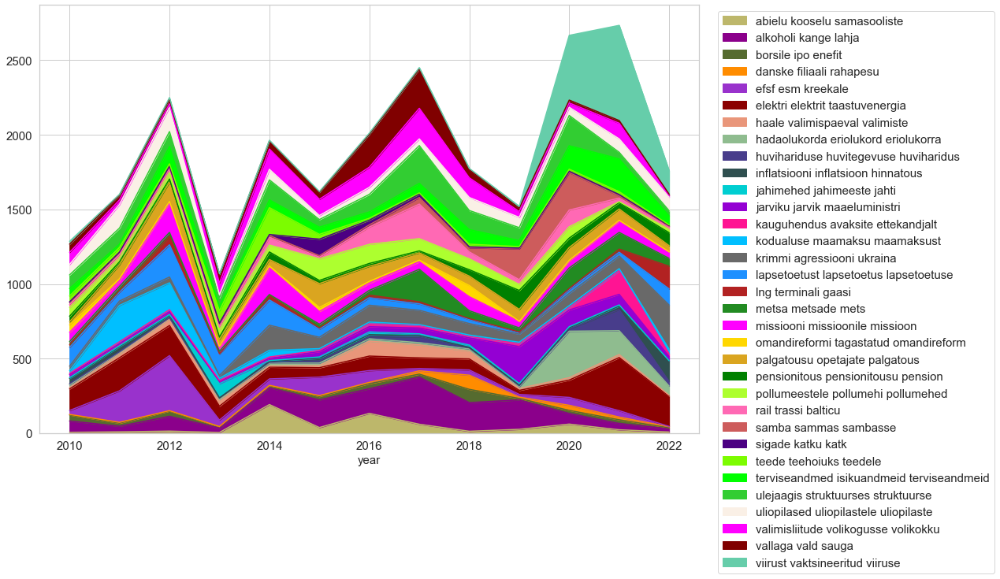

In [53]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories_inform)], colors, use_percentage=False,
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

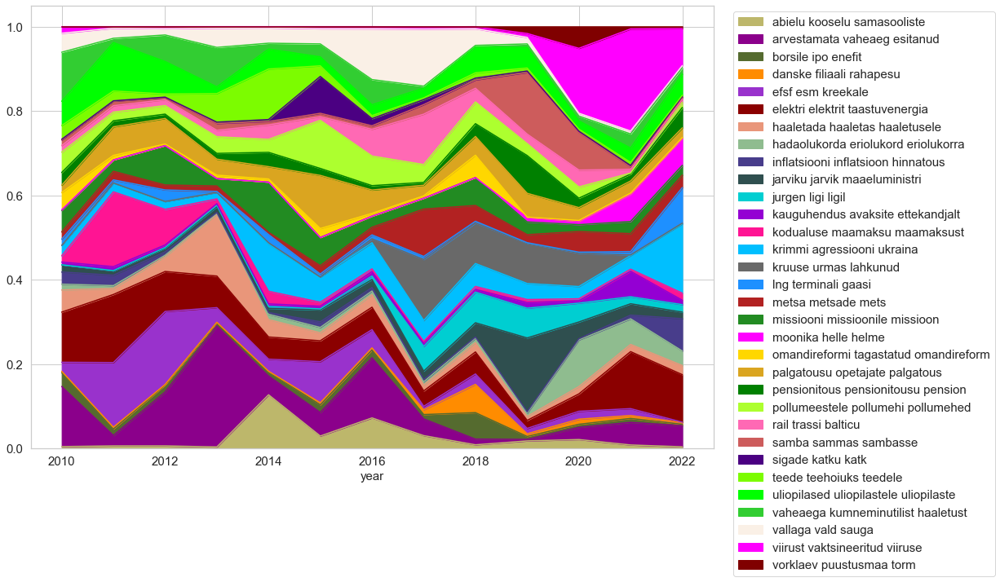

In [54]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories)], colors,
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

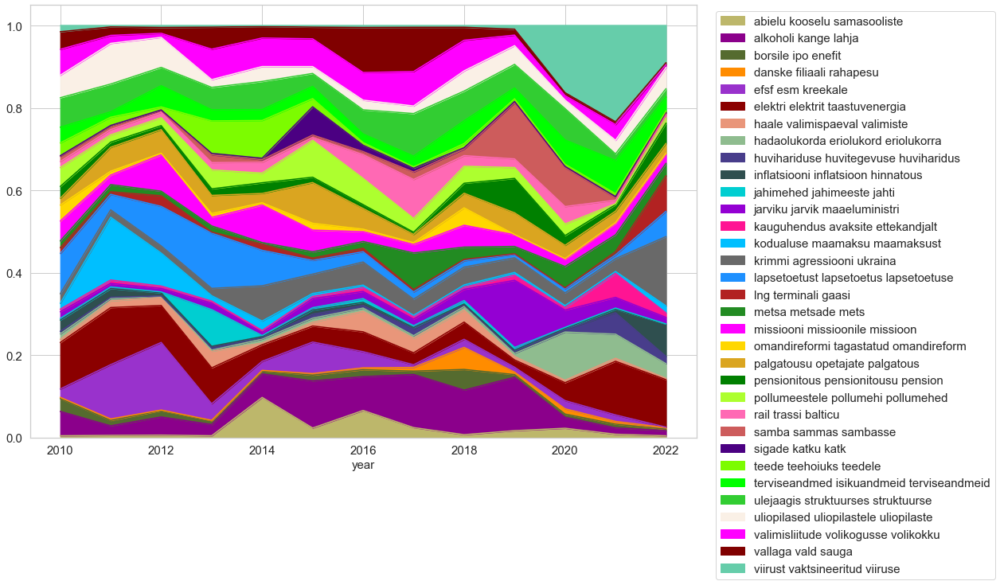

In [55]:
plot_topic_time_dynamics(df[df.topic_words3.isin(trendy_categories_inform)], colors,
                        legend_fontsize=15, bbox_to_anchor=(1.02, 1.00),
                         x_tick_fontsize=15, y_tick_fontsize=15, x_axis_fontsize=15)

## Heatmap of topic, cluster popularity

<AxesSubplot:xlabel='topic_cluster', ylabel='year'>

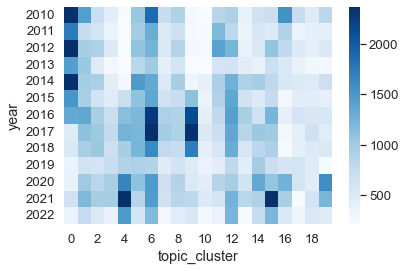

In [56]:
#topic clusters
sns.heatmap(df.groupby(['year'])['topic_cluster'].value_counts().unstack(), robust=True, cmap='Blues')

<AxesSubplot:xlabel='topic_cluster', ylabel='year'>

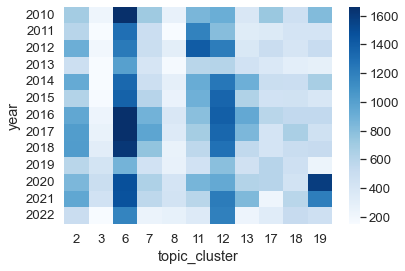

In [57]:
sns.heatmap(df_inform.groupby(['year'])['topic_cluster'].value_counts().unstack(), robust=True, cmap='Blues')

<AxesSubplot:xlabel='topic_id', ylabel='year'>

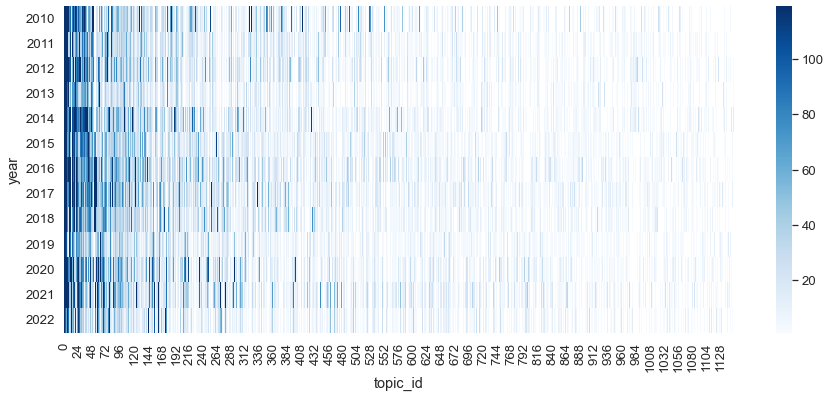

In [58]:
fig, ax =plt.subplots(figsize=(15,6))
sns.heatmap(df.groupby(['year'])['topic_id'].value_counts().unstack(), robust=True, cmap='Blues', ax =ax)

<AxesSubplot:xlabel='topic_id', ylabel='year'>

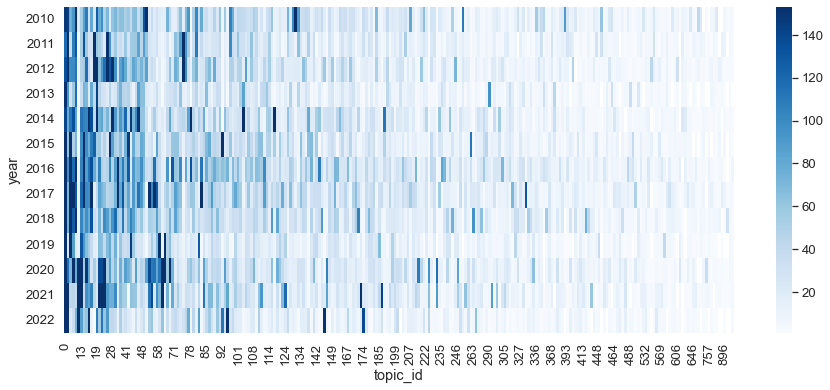

In [59]:
fig, ax =plt.subplots(figsize=(15,6))
sns.heatmap(df_inform.groupby(['year'])['topic_id'].value_counts().unstack(), robust=True, cmap='Blues', ax =ax)

## Compare years topic vectors

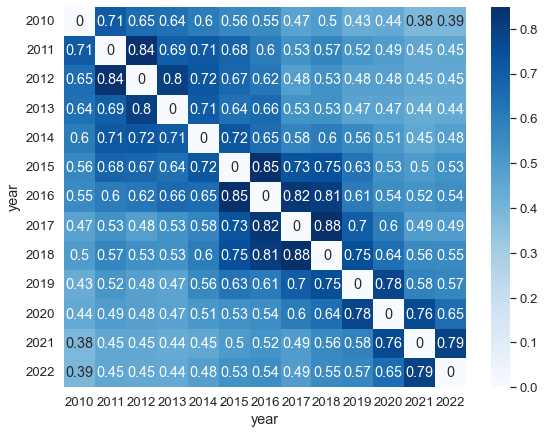

In [60]:
N_TOPICS=df.topic_words3.nunique()
df_year_topic_vecs, df_year_topic_cossim=create_plot_group_topvecs(df, N_TOPICS, 
                                                                   'year', 
                                                                   fillna=0, figsize=(9, 7))

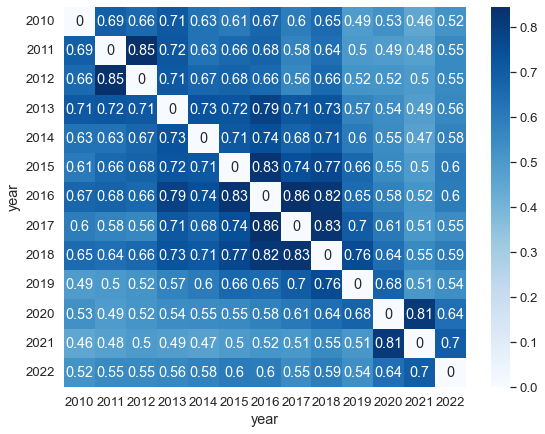

In [61]:
N_TOPICS=df_inform.topic_words3.nunique()
df_year_topic_vecs_inform, df_year_topic_cossim_inform=create_plot_group_topvecs(df_inform, N_TOPICS, 
                                                                   'year', 
                                                                   fillna=0, figsize=(9, 7))

<AxesSubplot:ylabel='year'>

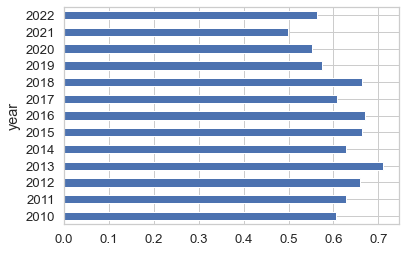

In [62]:
df_year_topic_cossim_inform.median(axis=1).plot(kind='barh')